In [31]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [32]:
from IPython import display
display.clear_output()
!pip install ultralytics==8.0.134
from ultralytics import YOLO
from ultralytics.yolo.engine.model import yolo
import ultralytics
ultralytics.checks()

import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display, Image

train_model=True

#trained_model_id=  #yaml
#dataset_id=
#tensorflow_log_file_id=



Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CPU
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.5/107.7 GB disk)


In [34]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [36]:
from ultralytics.yolo.v8.classify import val
from re import split

if train_model:
  model = YOLO('yolov8n.yaml')  # build a new model from YAML
  model = YOLO('yolov8n.pt')  # load a pretrained model (recommended for training)
  model = YOLO('yolov8n.yaml').load('yolov8n.pt')  # build from YAML and transfer weights

  model.train(data='/content/gdrive/MyDrive/CADCD dataset1/data.yaml', epochs=10, save=True)

  #yolo (task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=5 imgsz=640 plots=True

else:
  model=YOLO("/content/gdrive/MyDrive/Trained Model Weights/best.pt")



                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

In [37]:
# validation of model

metrics = model.val()
metrics.box.map    # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps


Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CPU
YOLOv8n summary (fused): 168 layers, 3008573 parameters, 0 gradients
val: Scanning /content/gdrive/MyDrive/CADCD dataset1/valid/labels.cache... 35 images, 3 backgrounds, 0 corrupt: 100%|██████████| 35/35 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:08<00:00,  2.98s/it]
                   all         35         93      0.458      0.446      0.455      0.277
                   Car         35         25      0.094       0.04      0.033    0.00885
            Pedestrian         35         68      0.822      0.853      0.877      0.546
Speed: 1.7ms preprocess, 186.2ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/val2


array([  0.0088534,     0.54563,     0.27724,     0.27724,     0.27724,     0.27724,     0.27724,     0.27724,     0.27724,     0.27724,     0.27724,     0.27724,     0.27724,     0.27724,     0.27724])


image 1/1 /content/gdrive/MyDrive/CADCD dataset1/train/images/0000006020.png: 512x640 5 Cars, 2 Trucks, 1 Bus, 259.3ms
Speed: 3.5ms preprocess, 259.3ms inference, 16.4ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs/detect/predict3
1 label saved to runs/detect/predict3/labels
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.


ultralytics.yolo.engine.results.Boxes object with attributes:

boxes: tensor([[8.8952e+02, 5.2852e+02, 1.2788e+03, 1.0240e+03, 9.9555e-01, 0.0000e+00],
        [0.0000e+00, 4.3493e+02, 2.1503e+02, 5.8436e+02, 9.8927e-01, 2.0000e+00],
        [3.5684e+02, 5.0229e+02, 4.4934e+02, 5.4938e+02, 9.0775e-01, 3.0000e+00],
        [3.2407e+01, 4.5596e+02, 3.5370e+02, 5.7540e+02, 8.7512e-01, 2.0000e+00],
        [9.2305e+02, 5.1495e+02, 1.0752e+03, 5.6450e+02, 8.5401e-01, 0.0000e+00],
        [1.0699e+03, 5.1379e+02, 1.2097e+03, 5.5341e+02, 6.4842e-01, 0.0000e+00],
        [1.1525e+03, 5.0835e+02, 1.2800e+03, 5.5578e+02, 5.2938e-01, 0.0000e+00],
        [1.2007e+03, 5.0634e+02, 1.2798e+03, 5.5538e+02, 4.3929e-01, 0.0000e+00]])
cls: tensor([0., 2., 3., 2., 0., 0., 0., 0.])
conf: tensor([0.9956, 0.9893, 0.9078, 0.8751, 0.8540, 0.6484, 0.5294, 0.4393])
data: tensor([[8.8952e+02, 5.2852e+02, 1.2788e+03, 1.0240e+03, 9.9555e-01, 0.0000e+00],
        [0.0000e+00, 4.3493e+02, 2.1503e+02, 5.8436e+02, 9.8

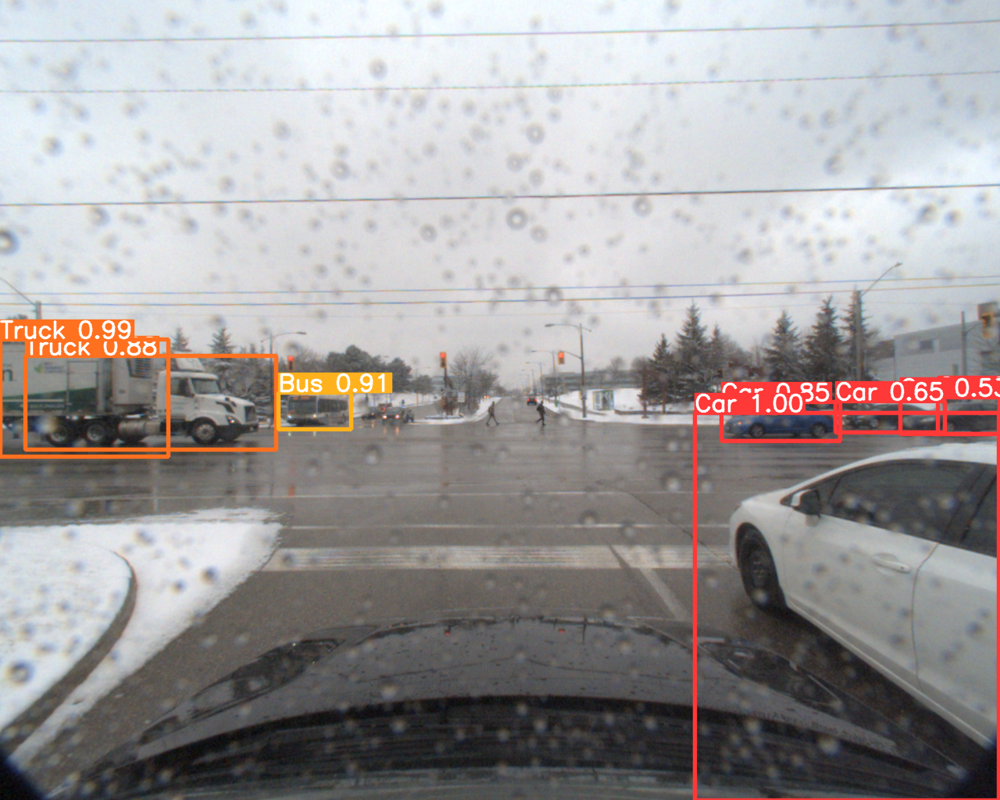

In [38]:
#testing of model on random images

import os
import random
import tensorflow as tf
import cv2 as cv
import sys
import numpy as np
import shutil
from PIL import Image


# Load the image using PIL
image_path = '/content/gdrive/MyDrive/CADCD dataset1/train/images/0000006020.png'

#image = Image.open(image_path)
source = image_path

# Test model on random image
results = model.predict(source, save=True, save_txt=True)

for r in results:
    im_array = r.plot()  # plot a BGR numpy array of predictions
    im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
    print(r.boxes)
    print(r.masks)
    print(r.keypoints)
    print(r.probs)
    im.show()  # show image

    im.save('results.jpg')

result=results[0]
Image.fromarray(result.plot()[:,:,::-1])

In [39]:
# Export the model
model.export(format='onnx')

Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CPU

PyTorch: starting from runs/detect/train2/weights/best.pt with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 19, 8400) (5.9 MB)

ONNX: starting export with onnx 1.14.0 opset 17...
ONNX: export success ✅ 1.7s, saved as runs/detect/train2/weights/best.onnx (11.7 MB)

Export complete (2.4s)
Results saved to /content/runs/detect/train2/weights
Predict:         yolo predict task=detect model=runs/detect/train2/weights/best.onnx imgsz=640 
Validate:        yolo val task=detect model=runs/detect/train2/weights/best.onnx imgsz=640 data=/content/gdrive/MyDrive/CADCD dataset1/data.yaml 
Visualize:       https://netron.app


============= Diagnostic Run torch.onnx.export version 2.0.1+cu118 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================



'runs/detect/train2/weights/best.onnx'

In [61]:
!pip install tensorboard
%load_ext tensorboard

# Specify the port number for TensorBoard
port_number = 6006

# Start TensorBoard
%tensorboard --logdir=/content/runs/detect/train2 --port 6007

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 53634), started 1:10:51 ago. (Use '!kill 53634' to kill it.)

<IPython.core.display.Javascript object>